In [1]:
import os
import sys
from pathlib import Path

import matplotlib.pyplot as plt
import numpy as np
from torchvision import transforms as T

current_dir = Path(os.getcwd())

if (current_dir.parent / "src").exists():
    PROJECT_ROOT = str(current_dir.parent)

elif (current_dir / "src").exists():
    PROJECT_ROOT = str(current_dir)
else:
    PROJECT_ROOT = os.path.abspath("..")

if PROJECT_ROOT not in sys.path:
    sys.path.append(PROJECT_ROOT)
    print(f"Added project root to path: {PROJECT_ROOT}")

Added project root to path: /Users/shivakumarjagadish/Developer/Projects/Thermal-UAV


In [2]:
%load_ext dotenv
%dotenv

try:
    from src.augmentations import RandomThermalNoise
    from src.data_pipeline import VedaiDataset

    print("Successfully imported src.data_pipeline and src.augmentations")

except ImportError as e:
    print("\nFATAL ERROR: Could not import from 'src'.")
    print(
        "Please ensure your project is installed in editable mode (uv pip install -e .)"
    )
    raise e

Successfully imported src.data_pipeline and src.augmentations


In [3]:
DATA_PATH_REL = os.environ.get("TEST_DATA_PATH")

if not DATA_PATH_REL:
    raise ValueError("TEST_DATA_PATH not set in .env file")

DATA_PATH = os.path.join(PROJECT_ROOT, DATA_PATH_REL)

if not os.path.exists(DATA_PATH):
    raise FileNotFoundError(f"Dataset not found at: {DATA_PATH}")

base_transform = T.Compose([T.ToTensor()])
dataset = VedaiDataset(root_dir=DATA_PATH, transform=base_transform)

print(f"Loaded {len(dataset)} images for augmentation demo.")

Loaded 1246 images for augmentation demo.


In [4]:
def visualize_augmentation(
    dataset_obj, idx, augmenter: RandomThermalNoise, title="Augmentation Demo"
):
    """
    Applies a thermal noise augmentation to a sample and visualizes the results.
    Shows Original, Augmented, and the isolated Noise pattern.
    """
    try:
        _, thermal_tensor, _ = dataset_obj[idx]
    except Exception as e:
        print(f"Error loading index {idx}: {e}")
        return

    original_p = augmenter.p
    augmenter.p = 1.0
    noisy_tensor = augmenter(thermal_tensor)
    augmenter.p = original_p  # Reset it back

    raw_np = thermal_tensor[0].numpy()
    noisy_np = noisy_tensor[0].numpy()

    noise_map = noisy_np - raw_np

    fig, ax = plt.subplots(1, 3, figsize=(24, 8))

    vmin, vmax = np.percentile(raw_np, (1, 99))

    ax[0].imshow(raw_np, cmap="inferno", vmin=vmin, vmax=vmax)
    ax[0].set_title(f"Original Clean (Sample {idx})", fontsize=14)
    ax[0].axis("off")

    ax[1].imshow(noisy_np, cmap="inferno", vmin=vmin, vmax=vmax)
    ax[1].set_title(f"Augmented: {title}", fontsize=14)
    ax[1].axis("off")

    limit = np.max(np.abs(noise_map)) + 1e-6  # Avoid zero division if no noise
    im2 = ax[2].imshow(noise_map, cmap="coolwarm", vmin=-limit, vmax=limit)
    ax[2].set_title("Isolated Noise Pattern", fontsize=14)
    ax[2].axis("off")
    fig.colorbar(im2, ax=ax[2], fraction=0.046, pad=0.04)

    plt.tight_layout()
    plt.show()

# Realistic Augmentation (3 examples, mild heavy and grainy)

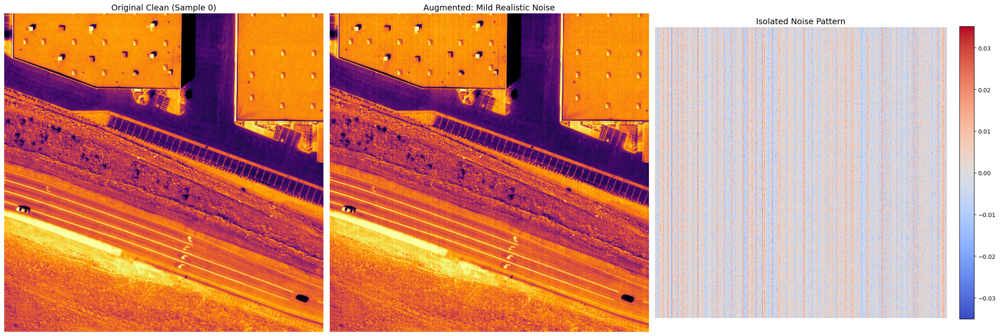

In [5]:
mild_noise = RandomThermalNoise(
    p=1.0,
    fpn_prob=1.0,
    grain_prob=1.0,
    vertical_stripe_intensity=0.02,
    horizontal_stripe_intensity=0.01,
    grain_intensity=0.02,  # Mild grain
)

visualize_augmentation(
    dataset, idx=0, augmenter=mild_noise, title="Mild Realistic Noise"
)

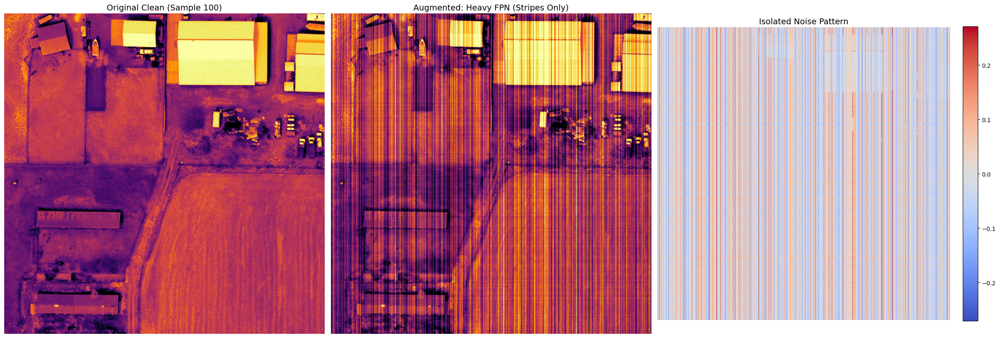

In [6]:
heavy_stripes = RandomThermalNoise(
    p=1.0,
    fpn_prob=1.0,
    grain_prob=0.0,  # Disable grain to see stripes clearly
    vertical_stripe_intensity=0.1,  # Strong vertical stripes
    horizontal_stripe_intensity=0.05,
    grain_intensity=0.0,
)

visualize_augmentation(
    dataset, idx=100, augmenter=heavy_stripes, title="Heavy FPN (Stripes Only)"
)

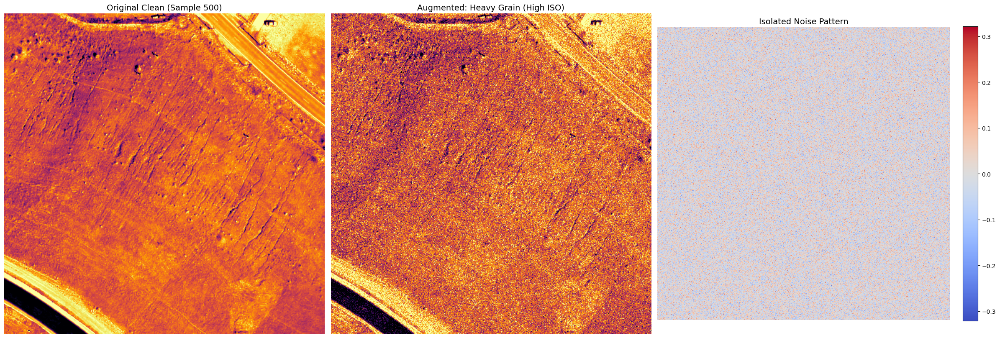

In [7]:
heavy_grain = RandomThermalNoise(
    p=1.0,
    fpn_prob=0.0,  # Disable stripes
    grain_prob=1.0,
    vertical_stripe_intensity=0.0,
    horizontal_stripe_intensity=0.0,
    grain_intensity=0.15,  # Very noisy/snowy image
)

visualize_augmentation(
    dataset, idx=500, augmenter=heavy_grain, title="Heavy Grain (High ISO)"
)

### Augmentation Validation Summary

**Analyst:** Shivakumar
**Date:** 08-11-25

**Findings:**
* The `RandomThermalNoise` module successfully simulates realistic thermal artifacts.
* **Mild Noise (Demo 1):** Recommended for standard training. It adds subtle realism without destroying easy targets.
* **Heavy FPN (Demo 2):** Confirmed that vertical/horizontal striping works independently. Good for testing extreme robustness.
* **Heavy Grain (Demo 3):** Simulates high-sensitivity/low-light conditions well.

**Recommendation for Phase 3 (Training):**
* Start with `mild_noise` settings (`v_stripe=0.02`, `grain=0.02`) probability `p=0.5` during initial training experiments.

# :)